## Paso 1: Carga del conjunto de datos

In [1]:
import pandas as pd

# Cargar el dataset completo
dataframe = pd.read_csv('https://raw.githubusercontent.com/4GeeksAcademy/regularized-linear-regression-project-tutorial/main/demographic_health_data.csv', sep=',')

dataframe

,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
0,1001,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,...,3644,12.9,11.9,13.8,5462,3.1,2.9,3.3,1326,3
1,1003,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,...,14692,12.0,11.0,13.1,20520,3.2,3.0,3.5,5479,4
2,1005,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,...,2373,19.7,18.6,20.6,3870,4.5,4.2,4.8,887,6
3,1007,22400,2456,10.964286,2596,11.589286,3029,13.522321,3113,13.897321,...,1789,14.1,13.2,14.9,2511,3.3,3.1,3.6,595,2
4,1009,57840,7095,12.266598,7570,13.087828,6742,11.656293,6884,11.901798,...,4661,13.5,12.6,14.5,6017,3.4,3.2,3.7,1507,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,56037,43051,6104,14.178532,6326,14.694200,5359,12.448027,6577,15.277229,...,2098,8.9,8.3,9.6,2834,2.6,2.4,2.8,821,5
3136,56039,23081,2384,10.328842,2185,9.466661,2967,12.854729,4093,17.733200,...,928,7.2,6.5,8.0,1360,2.4,2.2,2.6,447,5
3137,56041,20299,3121,15.375142,3205,15.788955,2153,10.606434,2702,13.311001,...,1163,10.4,9.5,11.2,1500,3.0,2.8,3.2,430,5
3138,56043,7885,858,10.881420,1113,14.115409,715,9.067850,903,11.452124,...,506,11.3,10.3,12.1,686,3.4,3.2,3.7,207,6


- CONCLUSIÓN

Mi dataset tiene 108 variables. Son muchas. Me quedo con el 30% de las predictoras usando el dataset de TRAIN. Si tenía 108, me quedo con 36

In [2]:
# Identificar el tipo de datos de cada columna
data_types = dataframe.dtypes


In [3]:
# Separar las columnas categóricas y numéricas
categorical_columns = list(data_types[data_types == 'object'].index)
numeric_columns = list(data_types[data_types != 'object'].index)

print(categorical_columns)
print(numeric_columns)

['COUNTY_NAME', 'STATE_NAME']
['fips', 'TOT_POP', '0-9', '0-9 y/o % of total pop', '19-Oct', '10-19 y/o % of total pop', '20-29', '20-29 y/o % of total pop', '30-39', '30-39 y/o % of total pop', '40-49', '40-49 y/o % of total pop', '50-59', '50-59 y/o % of total pop', '60-69', '60-69 y/o % of total pop', '70-79', '70-79 y/o % of total pop', '80+', '80+ y/o % of total pop', 'White-alone pop', '% White-alone', 'Black-alone pop', '% Black-alone', 'Native American/American Indian-alone pop', '% NA/AI-alone', 'Asian-alone pop', '% Asian-alone', 'Hawaiian/Pacific Islander-alone pop', '% Hawaiian/PI-alone', 'Two or more races pop', '% Two or more races', 'POP_ESTIMATE_2018', 'N_POP_CHG_2018', 'GQ_ESTIMATES_2018', 'R_birth_2018', 'R_death_2018', 'R_NATURAL_INC_2018', 'R_INTERNATIONAL_MIG_2018', 'R_DOMESTIC_MIG_2018', 'R_NET_MIG_2018', 'Less than a high school diploma 2014-18', 'High school diploma only 2014-18', "Some college or associate's degree 2014-18", "Bachelor's degree or higher 2014-18

In [4]:
# Eliminar las columnas categóricas para que solo queden las numéricas
num_variables = numeric_columns

num_variables

['fips',
 'TOT_POP',
 '0-9',
 '0-9 y/o % of total pop',
 '19-Oct',
 '10-19 y/o % of total pop',
 '20-29',
 '20-29 y/o % of total pop',
 '30-39',
 '30-39 y/o % of total pop',
 '40-49',
 '40-49 y/o % of total pop',
 '50-59',
 '50-59 y/o % of total pop',
 '60-69',
 '60-69 y/o % of total pop',
 '70-79',
 '70-79 y/o % of total pop',
 '80+',
 '80+ y/o % of total pop',
 'White-alone pop',
 '% White-alone',
 'Black-alone pop',
 '% Black-alone',
 'Native American/American Indian-alone pop',
 '% NA/AI-alone',
 'Asian-alone pop',
 '% Asian-alone',
 'Hawaiian/Pacific Islander-alone pop',
 '% Hawaiian/PI-alone',
 'Two or more races pop',
 '% Two or more races',
 'POP_ESTIMATE_2018',
 'N_POP_CHG_2018',
 'GQ_ESTIMATES_2018',
 'R_birth_2018',
 'R_death_2018',
 'R_NATURAL_INC_2018',
 'R_INTERNATIONAL_MIG_2018',
 'R_DOMESTIC_MIG_2018',
 'R_NET_MIG_2018',
 'Less than a high school diploma 2014-18',
 'High school diploma only 2014-18',
 "Some college or associate's degree 2014-18",
 "Bachelor's degree or 

In [5]:
# Aplicar el StandardScaler a las variables numéricas

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
norm_features = scaler.fit_transform(dataframe[num_variables])

# Crear un nuevo DataFrame con las variables numéricas escaladas
dataframe_norm = pd.DataFrame(norm_features, index=dataframe.index, columns=num_variables)

dataframe_norm

,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
0,-1.940874,-0.145679,-0.142421,0.158006,-0.135556,0.573496,-0.153144,0.027610,-0.139384,0.588469,...,-0.138900,-0.063696,-0.071720,-0.089834,-0.129902,-0.609615,-0.582796,-0.669652,-0.147523,-1.082865
1,-1.940742,0.341296,0.287476,-0.242861,0.320383,-0.193107,0.183774,-0.469965,0.230620,-0.110300,...,0.563986,-0.394103,-0.414900,-0.337677,0.376251,-0.433549,-0.393279,-0.343373,0.389791,-0.420704
2,-1.940610,-0.237785,-0.239429,-0.419441,-0.246181,-0.439718,-0.225971,0.272104,-0.218759,0.656538,...,-0.219763,2.432709,2.483064,2.317776,-0.183415,1.855312,1.880929,1.777443,-0.204321,0.903618
3,-1.940478,-0.245223,-0.246032,-0.426966,-0.254791,-0.609076,-0.230792,0.396168,-0.220555,1.264959,...,-0.256918,0.376846,0.423984,0.299632,-0.229096,-0.257483,-0.203761,-0.180233,-0.242100,-1.745026
4,-1.940346,-0.138966,-0.135053,0.186249,-0.137140,0.216679,-0.155888,-0.200808,-0.143570,0.088582,...,-0.074198,0.156575,0.195197,0.158008,-0.111247,-0.081417,-0.014244,-0.017093,-0.124105,-1.745026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,1.692310,-0.183307,-0.158761,1.086516,-0.166565,1.101851,-0.183788,0.052482,-0.149837,2.078427,...,-0.237259,-1.532170,-1.444440,-1.576887,-0.218239,-1.489946,-1.530382,-1.485351,-0.212860,0.241457
3136,1.692442,-0.243182,-0.247755,-0.726175,-0.264513,-1.778724,-0.232043,0.182593,-0.200548,3.526243,...,-0.311695,-2.156271,-2.130800,-2.143384,-0.267785,-1.842079,-1.909417,-1.811630,-0.261248,0.241457
3137,1.692574,-0.251523,-0.230123,1.649960,-0.240386,1.705104,-0.248464,-0.536677,-0.228946,0.919318,...,-0.296744,-0.981492,-0.986867,-1.010391,-0.263079,-0.785681,-0.772313,-0.832792,-0.263447,0.241457
3138,1.692706,-0.288743,-0.284261,-0.465984,-0.289869,0.782915,-0.277474,-1.028898,-0.265673,-0.176505,...,-0.338543,-0.651086,-0.681818,-0.691737,-0.290441,-0.081417,-0.014244,-0.017093,-0.292299,0.903618


In [6]:
# Crear un nuevo DataFrame con las variables numéricas escaladas
dataframe_norm = pd.DataFrame(norm_features, index=dataframe.index, columns=num_variables)

In [7]:
# Dividir el dataset en TRAIN y TEST

from sklearn.model_selection import train_test_split

X = dataframe_norm.drop(columns=['Heart disease_number'])
y = dataframe_norm['Heart disease_number']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [8]:
from sklearn.feature_selection import SelectKBest, f_regression

# Feature selection con SelectKBest
# En este caso, seleccionaremos el 30% de las predictoras (variables) más importantes
k = int(len(X_train.columns) * 0.3)
selector = SelectKBest(score_func=f_regression, k=35)
X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)



In [9]:
# Obtener las columnas seleccionadas
selected_columns = X_train.columns[selector.get_support()]

# Filtrar TRAIN y TEST para quedarnos con las variables seleccionadas y la columna objetivo
X_train_filtered = X_train[selected_columns]
X_test_filtered = X_test[selected_columns]

# Añadir la columna objetivo nuevamente a los DataFrames filtrados
X_train_filtered = X_train_filtered.assign(**{'Heart disease_number': y_train})
X_test_filtered = X_test_filtered.assign(**{'Heart disease_number': y_test})

In [10]:
# Juntar TRAIN y TEST para hacer un EDA completo
dataframe_filtered = pd.concat([X_train_filtered, X_test_filtered])

# Imprimir filas del nuevo DataFrame filtrado
dataframe_filtered

,TOT_POP,0-9,19-Oct,20-29,30-39,40-49,50-59,60-69,70-79,80+,...,ICU Beds_x,Total Population,Population Aged 60+,county_pop2018_18 and older,anycondition_number,Obesity_number,COPD_number,diabetes_number,CKD_number,Heart disease_number
1292,-0.232556,-0.227731,-0.234284,-0.232951,-0.226353,-0.231316,-0.229599,-0.233425,-0.234680,-0.234420,...,-0.281569,-0.231195,-0.229737,-0.233171,-0.234370,-0.232975,-0.223516,-0.218609,-0.219329,-0.225814
2302,-0.158676,-0.178665,-0.180166,-0.188266,-0.175070,-0.161168,-0.134688,-0.105618,-0.119270,-0.091822,...,-0.186994,-0.150293,-0.098866,-0.152859,-0.142645,-0.155304,-0.110080,-0.131449,-0.130962,-0.115392
761,-0.199114,-0.211128,-0.195138,-0.166782,-0.195036,-0.194045,-0.199725,-0.219256,-0.222207,-0.205154,...,-0.210637,-0.197005,-0.216056,-0.195125,-0.193205,-0.201976,-0.193106,-0.189197,-0.206391,-0.216207
2194,-0.036595,-0.037734,-0.017077,-0.057986,-0.052252,-0.033158,-0.020228,-0.032603,-0.023876,-0.046224,...,-0.210637,-0.036940,-0.030034,-0.039882,-0.003321,0.006163,-0.007077,-0.047515,-0.045054,-0.007276
1241,0.090839,0.094680,0.101662,0.056721,0.042392,0.068095,0.101699,0.144664,0.140685,0.166099,...,0.096733,0.097767,0.161314,0.088485,0.165555,0.182740,0.265603,0.123040,0.132454,0.197812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1351,-0.226952,-0.219406,-0.225840,-0.230853,-0.212838,-0.215832,-0.222200,-0.241248,-0.249174,-0.236658,...,-0.281569,-0.226648,-0.243989,-0.228757,-0.247448,-0.242779,-0.292800,-0.242542,-0.240418,-0.266806
670,-0.295174,-0.290625,-0.300371,-0.279935,-0.271226,-0.282276,-0.298756,-0.319421,-0.327363,-0.310528,...,-0.281569,-0.293772,-0.320346,-0.294902,-0.316619,-0.319322,-0.344715,-0.295920,-0.300062,-0.334507
2283,-0.189552,-0.205100,-0.196226,-0.191434,-0.186972,-0.180149,-0.183407,-0.181676,-0.191001,-0.157152,...,-0.222459,-0.183217,-0.177617,-0.185384,-0.178418,-0.175558,-0.174210,-0.178306,-0.176892,-0.179570
2482,-0.019742,-0.015725,-0.002270,-0.019696,-0.053089,-0.036540,-0.013111,0.004195,-0.003466,-0.014968,...,0.616898,-0.013217,-0.000553,-0.019660,0.065233,0.058235,0.088609,0.068519,0.026622,0.062859


In [11]:
import os

# Ruta del proyecto
project_path = r'C:\Users\Jaime\Desktop\4GEEKS\PROYECTOS\016-PROYECTO1-regularized-linear-regression-project-tutorial-main'

# Guardar el conjunto de datos de entrenamiento (TRAIN) en un archivo CSV
train_csv_path = os.path.join(project_path, 'train_Heart disease_number.csv')
X_train_filtered.to_csv(train_csv_path, index=False)

# Guardar el conjunto de datos de prueba (TEST) en un archivo CSV
test_csv_path = os.path.join(project_path, 'test_Heart disease_number.csv')
X_test_filtered.to_csv(test_csv_path, index=False)

- CONCLUSIÓN

de las 108 varibles nos quedamos con las 36 mejores para empezar el EDA. elijo Heart disease_number como variable a analizar

## Paso 2: Realiza un EDA completo

In [12]:
# Obtener las dimensiones
dataframe_filtered.shape

(3140, 36)

In [13]:
# Obtener información sobre tipos de datos y valores no nulos
dataframe_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3140 entries, 1292 to 2650
Data columns (total 36 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   TOT_POP                                               3140 non-null   float64
 1   0-9                                                   3140 non-null   float64
 2   19-Oct                                                3140 non-null   float64
 3   20-29                                                 3140 non-null   float64
 4   30-39                                                 3140 non-null   float64
 5   40-49                                                 3140 non-null   float64
 6   50-59                                                 3140 non-null   float64
 7   60-69                                                 3140 non-null   float64
 8   70-79                                                 3140 n

In [26]:
dataframe_filtered.drop_duplicates(inplace = True)

In [27]:
#comprobar q se han eliminado duplicados

dataframe_filtered.duplicated().sum()

0

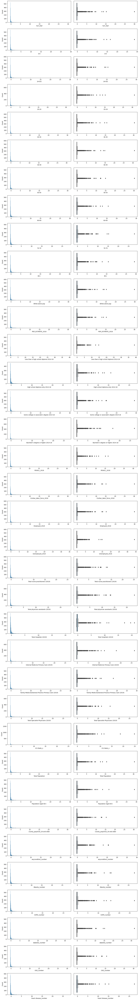

In [28]:
#Análisis sobre variables numericas

import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure of subplots with configuration of 19 rows and 2 columns
fig, axis = plt.subplots(36, 2, figsize=(14, 100))

# Variables numéricas a incluir en el análisis
numeric_variables = ['TOT_POP', '0-9', '19-Oct', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+',
                     'White-alone pop', 'POP_ESTIMATE_2018', 'Less than a high school diploma 2014-18',
                     "High school diploma only 2014-18", "Some college or associate's degree 2014-18",
                     "Bachelor's degree or higher 2014-18", 'POVALL_2018', 'Civilian_labor_force_2018',
                     'Employed_2018', 'Unemployed_2018', 'Total nurse practitioners (2019)',
                     'Total physician assistants (2019)', 'Total Hospitals (2019)', 'Internal Medicine Primary Care (2019)',
                     'Family Medicine/General Practice Primary Care (2019)', 'Total Specialist Physicians (2019)',
                     'ICU Beds_x', 'Total Population', 'Population Aged 60+', 'county_pop2018_18 and older',
                     'anycondition_number', 'Obesity_number', 'COPD_number', 'diabetes_number', 'CKD_number',
                     'Heart disease_number']

# Generar los histogramas y boxplots para las variables numéricas
for i, var in enumerate(numeric_variables):
    sns.histplot(ax=axis[i, 0], data=dataframe_filtered, x=var)
    sns.boxplot(ax=axis[i, 1], data=dataframe_filtered, x=var)

# Ajustar el layout
plt.tight_layout()

# Mostrar el plot
plt.show()

In [29]:
#Análisis numérico-numérico

import matplotlib.pyplot as plt
import seaborn as sns

# Variables numéricas a incluir en el análisis
numeric_variables = ['TOT_POP', '0-9', '19-Oct', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+',
                     'White-alone pop', 'POP_ESTIMATE_2018', 'Less than a high school diploma 2014-18',
                     "High school diploma only 2014-18", "Some college or associate's degree 2014-18",
                     "Bachelor's degree or higher 2014-18", 'POVALL_2018', 'Civilian_labor_force_2018',
                     'Employed_2018', 'Unemployed_2018', 'Total nurse practitioners (2019)',
                     'Total physician assistants (2019)', 'Total Hospitals (2019)', 'Internal Medicine Primary Care (2019)',
                     'Family Medicine/General Practice Primary Care (2019)', 'Total Specialist Physicians (2019)',
                     'ICU Beds_x', 'Total Population', 'Population Aged 60+', 'county_pop2018_18 and older',
                     'anycondition_number', 'Obesity_number', 'COPD_number', 'diabetes_number', 'CKD_number',]

# Crear una figura de subplots con configuración de filas y columnas
num_rows = len(numeric_variables)
fig, axis = plt.subplots(num_rows, 2, figsize=(20, 8*num_rows))

# Generar los gráficos de dispersión y las matrices de correlación para las variables numéricas
for i, var in enumerate(numeric_variables):
    sns.regplot(ax=axis[i, 0], data=dataframe_filtered, x=var, y="Heart disease_number")
    sns.heatmap(dataframe_filtered[[var, "Heart disease_number"]].corr(), annot=True, fmt=".2f", ax=axis[i, 1], cbar=False)
    axis[i, 0].set_ylabel("Heart disease_number")

# Ajustar el layout
plt.tight_layout()

# Mostrar el plot
plt.show()

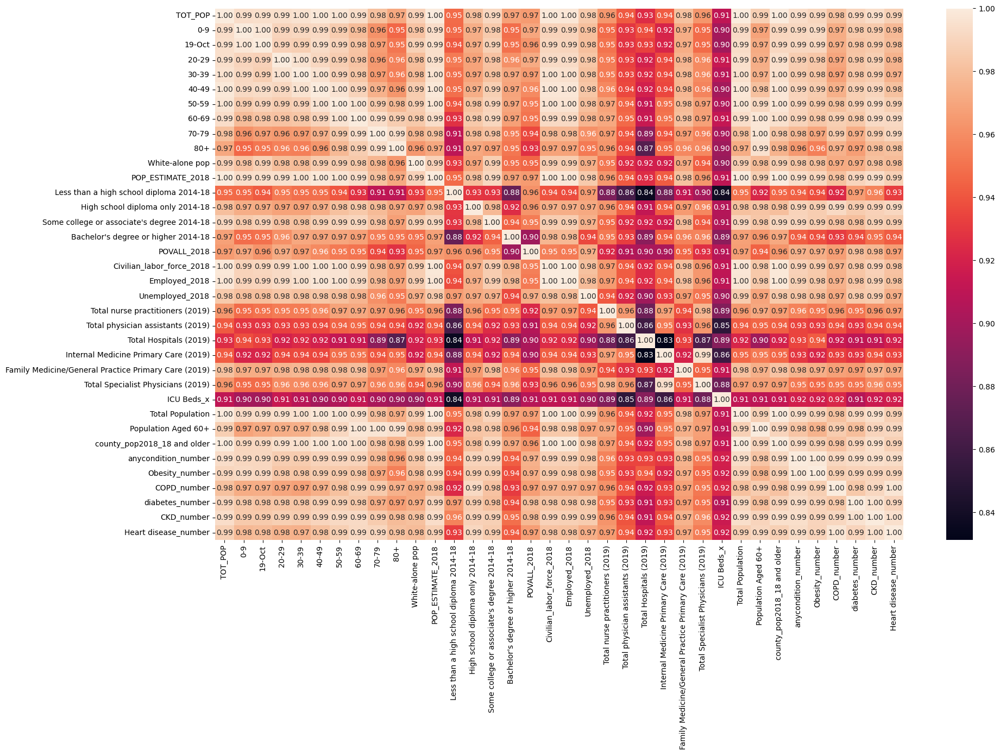

In [45]:
#analisis correlaciones

import matplotlib.pyplot as plt
import seaborn as sns

# Variables numéricas a incluir en el análisis
numeric_variables = ['TOT_POP', '0-9', '19-Oct', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+',
                     'White-alone pop', 'POP_ESTIMATE_2018', 'Less than a high school diploma 2014-18',
                     "High school diploma only 2014-18", "Some college or associate's degree 2014-18",
                     "Bachelor's degree or higher 2014-18", 'POVALL_2018', 'Civilian_labor_force_2018',
                     'Employed_2018', 'Unemployed_2018', 'Total nurse practitioners (2019)',
                     'Total physician assistants (2019)', 'Total Hospitals (2019)', 'Internal Medicine Primary Care (2019)',
                     'Family Medicine/General Practice Primary Care (2019)', 'Total Specialist Physicians (2019)',
                     'ICU Beds_x', 'Total Population', 'Population Aged 60+', 'county_pop2018_18 and older',
                     'anycondition_number', 'Obesity_number', 'COPD_number', 'diabetes_number', 'CKD_number','Heart disease_number']

# Crear una figura de subplots con configuración de 1 fila y 1 columna
fig, axis = plt.subplots(figsize=(20, 14))

# Calcular la matriz de correlación para las variables numéricas
correlation_matrix = dataframe_filtered[numeric_variables].corr()

# Generar el heatmap de correlaciones
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", ax=axis)

# Ajustar el layout
plt.tight_layout()

# Mostrar el plot
plt.show()

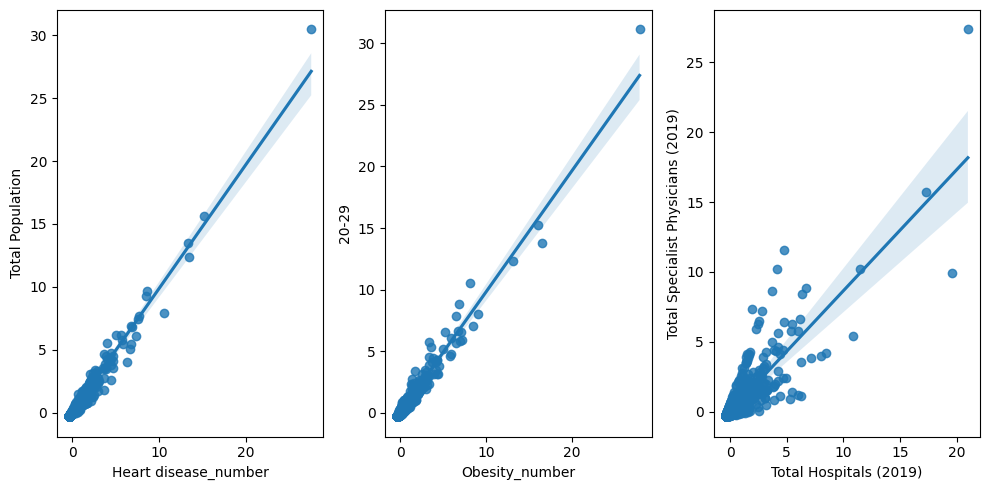

In [47]:
#Analizamos las variables mas altas

fig, axis = plt.subplots(figsize = (10, 5), ncols = 3)

sns.regplot(ax = axis[0], data = dataframe_filtered, x = "Heart disease_number", y = "Total Population")
sns.regplot(ax = axis[1], data = dataframe_filtered, x = "Obesity_number", y = "20-29")
sns.regplot(ax = axis[2], data = dataframe_filtered, x = "Total Hospitals (2019)", y = "Total Specialist Physicians (2019)")

plt.tight_layout()

plt.show()

In [32]:
#dibujar el pairplot

'''sns.pairplot(data = dataframe_filtered)'''

In [83]:
#análisis descriptivo

dataframe_filtered.describe()

,TOT_POP,0-9,19-Oct,20-29,30-39,40-49,50-59,60-69,70-79,80+,...,ICU Beds_x,Total Population,Population Aged 60+,county_pop2018_18 and older,anycondition_number,Obesity_number,COPD_number,diabetes_number,CKD_number,Heart disease_number
count,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,...,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03
mean,-9.051500e-18,2.262875e-18,9.051500e-18,7.920062e-18,-1.131437e-18,1.584012e-17,-1.357725e-17,-2.036587e-17,-1.357725e-17,-2.262875e-18,...,-3.960031e-17,-2.262875e-18,-2.941737e-17,6.788625e-18,3.846887e-17,9.051500e-18,1.584012e-17,3.168025e-17,-1.131437e-17,1.584012e-17
std,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,...,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00,1.000159e+00
min,-3.121198e-01,-3.047872e-01,-3.161948e-01,-2.918979e-01,-2.838831e-01,-2.963565e-01,-3.189607e-01,-3.446870e-01,-3.556604e-01,-3.345704e-01,...,-2.815690e-01,-3.111227e-01,-3.468620e-01,-3.123154e-01,-3.372518e-01,-3.391463e-01,-3.702904e-01,-3.131301e-01,-3.186924e-01,-3.580776e-01
25%,-2.795133e-01,-2.741537e-01,-2.836836e-01,-2.664036e-01,-2.589409e-01,-2.677992e-01,-2.845690e-01,-3.024857e-01,-3.090849e-01,-2.903815e-01,...,-2.815690e-01,-2.779462e-01,-3.014560e-01,-2.799248e-01,-2.950351e-01,-2.981820e-01,-3.188845e-01,-2.735753e-01,-2.783582e-01,-3.073820e-01
50%,-2.350279e-01,-2.316544e-01,-2.387544e-01,-2.291985e-01,-2.228519e-01,-2.263121e-01,-2.369849e-01,-2.464634e-01,-2.486316e-01,-2.383995e-01,...,-2.815690e-01,-2.330623e-01,-2.445265e-01,-2.343899e-01,-2.390227e-01,-2.430144e-01,-2.458157e-01,-2.212978e-01,-2.261859e-01,-2.423072e-01
75%,-1.087650e-01,-1.110821e-01,-1.075208e-01,-1.108150e-01,-1.143708e-01,-1.096212e-01,-1.049024e-01,-9.288399e-02,-8.116194e-02,-9.416389e-02,...,-1.397058e-01,-1.057634e-01,-8.496838e-02,-1.083046e-01,-8.479893e-02,-9.043897e-02,-6.999866e-02,-8.898622e-02,-8.926990e-02,-7.824307e-02
max,2.998627e+01,2.860034e+01,2.899335e+01,3.111981e+01,3.037631e+01,3.076458e+01,3.025636e+01,2.904431e+01,2.786937e+01,2.920275e+01,...,2.485185e+01,3.046729e+01,2.897607e+01,3.031521e+01,2.876407e+01,2.783736e+01,2.724561e+01,3.169791e+01,3.044300e+01,2.748978e+01


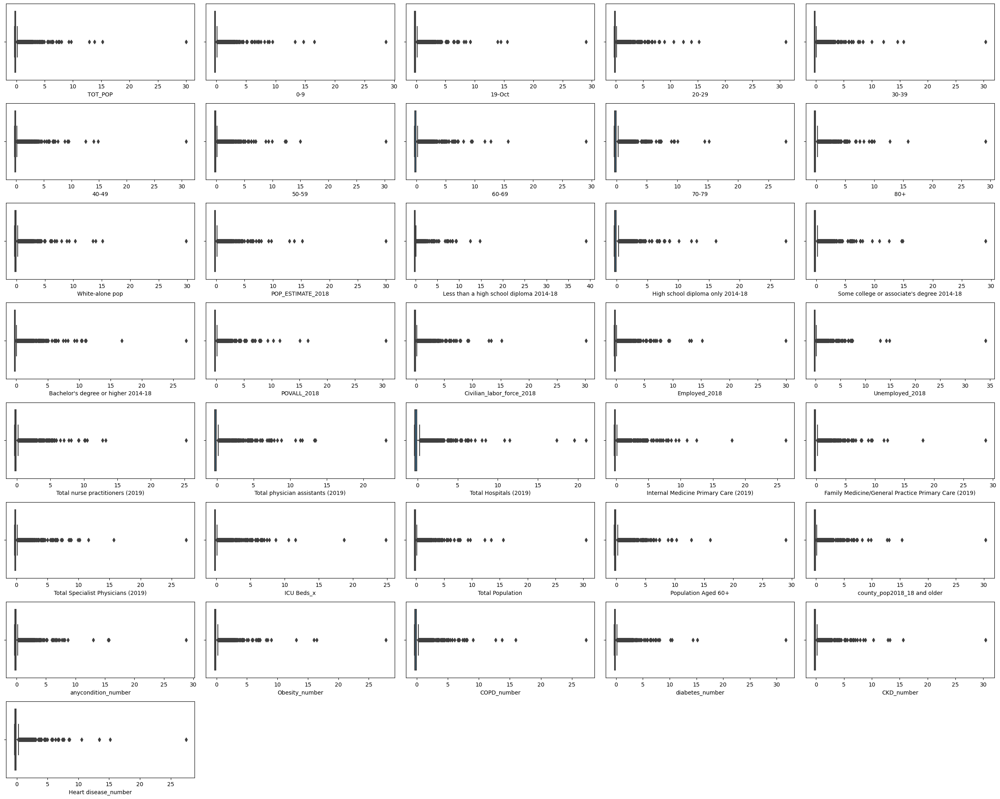

In [84]:
#Buscar outliers

fig, axis = plt.subplots(8, 5, figsize=(25, 20))

sns.boxplot(ax=axis[0, 0], data=dataframe_filtered, x='TOT_POP')
sns.boxplot(ax=axis[0, 1], data=dataframe_filtered, x='0-9')
sns.boxplot(ax=axis[0, 2], data=dataframe_filtered, x='19-Oct')
sns.boxplot(ax=axis[0, 3], data=dataframe_filtered, x='20-29')
sns.boxplot(ax=axis[0, 4], data=dataframe_filtered, x='30-39')

sns.boxplot(ax=axis[1, 0], data=dataframe_filtered, x='40-49')
sns.boxplot(ax=axis[1, 1], data=dataframe_filtered, x='50-59')
sns.boxplot(ax=axis[1, 2], data=dataframe_filtered, x='60-69')
sns.boxplot(ax=axis[1, 3], data=dataframe_filtered, x='70-79')
sns.boxplot(ax=axis[1, 4], data=dataframe_filtered, x='80+')

sns.boxplot(ax=axis[2, 0], data=dataframe_filtered, x='White-alone pop')
sns.boxplot(ax=axis[2, 1], data=dataframe_filtered, x='POP_ESTIMATE_2018')
sns.boxplot(ax=axis[2, 2], data=dataframe_filtered, x="Less than a high school diploma 2014-18")
sns.boxplot(ax=axis[2, 3], data=dataframe_filtered, x="High school diploma only 2014-18")
sns.boxplot(ax=axis[2, 4], data=dataframe_filtered, x="Some college or associate's degree 2014-18")

sns.boxplot(ax=axis[3, 0], data=dataframe_filtered, x="Bachelor's degree or higher 2014-18")
sns.boxplot(ax=axis[3, 1], data=dataframe_filtered, x='POVALL_2018')
sns.boxplot(ax=axis[3, 2], data=dataframe_filtered, x='Civilian_labor_force_2018')
sns.boxplot(ax=axis[3, 3], data=dataframe_filtered, x='Employed_2018')
sns.boxplot(ax=axis[3, 4], data=dataframe_filtered, x='Unemployed_2018')

sns.boxplot(ax=axis[4, 0], data=dataframe_filtered, x='Total nurse practitioners (2019)')
sns.boxplot(ax=axis[4, 1], data=dataframe_filtered, x='Total physician assistants (2019)')
sns.boxplot(ax=axis[4, 2], data=dataframe_filtered, x='Total Hospitals (2019)')
sns.boxplot(ax=axis[4, 3], data=dataframe_filtered, x='Internal Medicine Primary Care (2019)')
sns.boxplot(ax=axis[4, 4], data=dataframe_filtered, x='Family Medicine/General Practice Primary Care (2019)')

sns.boxplot(ax=axis[5, 0], data=dataframe_filtered, x='Total Specialist Physicians (2019)')
sns.boxplot(ax=axis[5, 1], data=dataframe_filtered, x='ICU Beds_x')
sns.boxplot(ax=axis[5, 2], data=dataframe_filtered, x='Total Population')
sns.boxplot(ax=axis[5, 3], data=dataframe_filtered, x='Population Aged 60+')
sns.boxplot(ax=axis[5, 4], data=dataframe_filtered, x='county_pop2018_18 and older')

sns.boxplot(ax=axis[6, 0], data=dataframe_filtered, x='anycondition_number')
sns.boxplot(ax=axis[6, 1], data=dataframe_filtered, x='Obesity_number')
sns.boxplot(ax=axis[6, 2], data=dataframe_filtered, x='COPD_number')
sns.boxplot(ax=axis[6, 3], data=dataframe_filtered, x='diabetes_number')
sns.boxplot(ax=axis[6, 4], data=dataframe_filtered, x='CKD_number')

sns.boxplot(ax=axis[7, 0], data=dataframe_filtered, x='Heart disease_number')
fig.delaxes(axis[7, 1])
fig.delaxes(axis[7, 2])
fig.delaxes(axis[7, 3])
fig.delaxes(axis[7, 4])



plt.tight_layout()

plt.show()


In [85]:
# Analizar outliers para cada variable seleccionada
numeric_variables = ['TOT_POP', '0-9', '19-Oct', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+',
                     'White-alone pop', 'POP_ESTIMATE_2018', 'Less than a high school diploma 2014-18',
                     "High school diploma only 2014-18", "Some college or associate's degree 2014-18",
                     "Bachelor's degree or higher 2014-18", 'POVALL_2018', 'Civilian_labor_force_2018',
                     'Employed_2018', 'Unemployed_2018', 'Total nurse practitioners (2019)',
                     'Total physician assistants (2019)', 'Total Hospitals (2019)', 'Internal Medicine Primary Care (2019)',
                     'Family Medicine/General Practice Primary Care (2019)', 'Total Specialist Physicians (2019)',
                     'ICU Beds_x', 'Total Population', 'Population Aged 60+', 'county_pop2018_18 and older',
                     'anycondition_number', 'Obesity_number', 'COPD_number', 'diabetes_number', 'CKD_number', 'Heart disease_number']

for variable in numeric_variables:
    variable_stats = dataframe_filtered[variable].describe()
    print(variable_stats)

    variable_iqr = variable_stats["75%"] - variable_stats["25%"]
    upper_limit = variable_stats["75%"] + 1.5 * variable_iqr
    lower_limit = variable_stats["25%"] - 1.5 * variable_iqr

    print(f"- Los límites superior e inferior para la búsqueda de outliers en {variable} son {round(upper_limit, 2)} y {round(lower_limit, 2)}, con un rango intercuartílico de {round(variable_iqr, 2)}\n")


count    3.140000e+03
mean    -9.051500e-18
std      1.000159e+00
min     -3.121198e-01
25%     -2.795133e-01
50%     -2.350279e-01
75%     -1.087650e-01
max      2.998627e+01
Name: TOT_POP, dtype: float64
- Los límites superior e inferior para la búsqueda de outliers en TOT_POP son 0.15 y -0.54, con un rango intercuartílico de 0.17

count    3.140000e+03
mean     2.262875e-18
std      1.000159e+00
min     -3.047872e-01
25%     -2.741537e-01
50%     -2.316544e-01
75%     -1.110821e-01
max      2.860034e+01
Name: 0-9, dtype: float64
- Los límites superior e inferior para la búsqueda de outliers en 0-9 son 0.13 y -0.52, con un rango intercuartílico de 0.16

count    3.140000e+03
mean     9.051500e-18
std      1.000159e+00
min     -3.161948e-01
25%     -2.836836e-01
50%     -2.387544e-01
75%     -1.075208e-01
max      2.899335e+01
Name: 19-Oct, dtype: float64
- Los límites superior e inferior para la búsqueda de outliers en 19-Oct son 0.16 y -0.55, con un rango intercuartílico de 0.18

co

In [86]:
#Análisis de valores faltantes

dataframe_filtered.isnull().sum()

TOT_POP                                                 0
0-9                                                     0
19-Oct                                                  0
20-29                                                   0
30-39                                                   0
40-49                                                   0
50-59                                                   0
60-69                                                   0
70-79                                                   0
80+                                                     0
White-alone pop                                         0
POP_ESTIMATE_2018                                       0
Less than a high school diploma 2014-18                 0
High school diploma only 2014-18                        0
Some college or associate's degree 2014-18              0
Bachelor's degree or higher 2014-18                     0
POVALL_2018                                             0
Civilian_labor

In [87]:
#escalado de valores (feature scaling)


#Normalización

from sklearn.preprocessing import StandardScaler

# Variables numéricas seleccionadas
numeric_variables = ['TOT_POP', '0-9', '19-Oct', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+',
                     'White-alone pop', 'POP_ESTIMATE_2018', 'Less than a high school diploma 2014-18',
                     "High school diploma only 2014-18", "Some college or associate's degree 2014-18",
                     "Bachelor's degree or higher 2014-18", 'POVALL_2018', 'Civilian_labor_force_2018',
                     'Employed_2018', 'Unemployed_2018', 'Total nurse practitioners (2019)',
                     'Total physician assistants (2019)', 'Total Hospitals (2019)', 'Internal Medicine Primary Care (2019)',
                     'Family Medicine/General Practice Primary Care (2019)', 'Total Specialist Physicians (2019)',
                     'ICU Beds_x', 'Total Population', 'Population Aged 60+', 'county_pop2018_18 and older',
                     'anycondition_number', 'Obesity_number', 'COPD_number', 'diabetes_number', 'CKD_number','Heart disease_number']

# Crear un DataFrame con las variables numéricas seleccionadas
dataframe_selected = dataframe_filtered[numeric_variables]

# Normalizar las variables numéricas
scaler = StandardScaler()
norm_features = scaler.fit_transform(dataframe_selected)

# Crear un DataFrame con las variables normalizadas
dataframe_norm = pd.DataFrame(norm_features, index=dataframe_selected.index, columns=numeric_variables)
dataframe_norm.head(10)

,TOT_POP,0-9,19-Oct,20-29,30-39,40-49,50-59,60-69,70-79,80+,...,ICU Beds_x,Total Population,Population Aged 60+,county_pop2018_18 and older,anycondition_number,Obesity_number,COPD_number,diabetes_number,CKD_number,Heart disease_number
1292,-0.232556,-0.227731,-0.234284,-0.232951,-0.226353,-0.231316,-0.229599,-0.233425,-0.234680,-0.234420,...,-0.281569,-0.231195,-0.229737,-0.233171,-0.234370,-0.232975,-0.223516,-0.218609,-0.219329,-0.225814
2302,-0.158676,-0.178665,-0.180166,-0.188266,-0.175070,-0.161168,-0.134688,-0.105618,-0.119270,-0.091822,...,-0.186994,-0.150293,-0.098866,-0.152859,-0.142645,-0.155304,-0.110080,-0.131449,-0.130962,-0.115392
761,-0.199114,-0.211128,-0.195138,-0.166782,-0.195036,-0.194045,-0.199725,-0.219256,-0.222207,-0.205154,...,-0.210637,-0.197005,-0.216056,-0.195125,-0.193205,-0.201976,-0.193106,-0.189197,-0.206391,-0.216207
2194,-0.036595,-0.037734,-0.017077,-0.057986,-0.052252,-0.033158,-0.020228,-0.032603,-0.023876,-0.046224,...,-0.210637,-0.036940,-0.030034,-0.039882,-0.003321,0.006163,-0.007077,-0.047515,-0.045054,-0.007276
1241,0.090839,0.094680,0.101662,0.056721,0.042392,0.068095,0.101699,0.144664,0.140685,0.166099,...,0.096733,0.097767,0.161314,0.088485,0.165555,0.182740,0.265603,0.123040,0.132454,0.197812
221,2.335967,1.417842,1.118606,2.763126,3.459669,2.483265,2.195003,2.369472,2.335785,2.924379,...,3.702421,2.320907,2.571336,2.645482,1.508821,1.385789,1.467024,1.947284,1.993193,1.888156
543,-0.251523,-0.246535,-0.256305,-0.242614,-0.237500,-0.241991,-0.250248,-0.268078,-0.265936,-0.268246,...,-0.281569,-0.247971,-0.263730,-0.251687,-0.264177,-0.269843,-0.264552,-0.231550,-0.240418,-0.266742
2360,-0.303986,-0.296151,-0.306686,-0.286310,-0.276962,-0.289846,-0.311539,-0.334343,-0.344519,-0.319316,...,-0.281569,-0.303006,-0.335379,-0.304508,-0.329069,-0.330886,-0.362592,-0.306239,-0.310800,-0.347958
2250,1.571089,1.241457,1.514630,1.129087,1.211876,1.499836,2.018620,2.116090,2.063357,2.192569,...,0.782405,1.596718,2.125314,1.621665,1.649004,1.661647,1.664122,1.481097,1.444623,1.662700
1803,-0.299368,-0.293926,-0.303351,-0.280460,-0.270797,-0.285934,-0.306810,-0.329997,-0.338800,-0.313015,...,-0.281569,-0.297868,-0.328587,-0.299363,-0.320877,-0.323002,-0.357948,-0.296962,-0.302391,-0.341873


In [88]:
#escalado minimo-maximo

from sklearn.preprocessing import MinMaxScaler

#Variables numéricas seleccionadas
numeric_variables = ['TOT_POP', '0-9', '19-Oct', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79', '80+',
                     'White-alone pop', 'POP_ESTIMATE_2018', 'Less than a high school diploma 2014-18',
                     "High school diploma only 2014-18", "Some college or associate's degree 2014-18",
                     "Bachelor's degree or higher 2014-18", 'POVALL_2018', 'Civilian_labor_force_2018',
                     'Employed_2018', 'Unemployed_2018', 'Total nurse practitioners (2019)',
                     'Total physician assistants (2019)', 'Total Hospitals (2019)', 'Internal Medicine Primary Care (2019)',
                     'Family Medicine/General Practice Primary Care (2019)', 'Total Specialist Physicians (2019)',
                     'ICU Beds_x', 'Total Population', 'Population Aged 60+', 'county_pop2018_18 and older',
                     'anycondition_number', 'Obesity_number', 'COPD_number', 'diabetes_number', 'CKD_number','Heart disease_number']

# Crear un DataFrame con las variables numéricas seleccionadas
dataframe_selected = dataframe_filtered[numeric_variables]

# Escalar las variables numéricas utilizando MinMaxScaler
scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(dataframe_selected)

# Crear un DataFrame con las variables escaladas
dataframe_scal = pd.DataFrame(scaled_features, index=dataframe_selected.index, columns=numeric_variables)
dataframe_scal.head(10)



,TOT_POP,0-9,19-Oct,20-29,30-39,40-49,50-59,60-69,70-79,80+,...,ICU Beds_x,Total Population,Population Aged 60+,county_pop2018_18 and older,anycondition_number,Obesity_number,COPD_number,diabetes_number,CKD_number,Heart disease_number
1292,0.002626,0.002666,0.002795,0.001877,0.001876,0.002094,0.002923,0.003786,0.004286,0.003391,...,0.000000,0.002597,0.003994,0.002584,0.003535,0.003768,0.005315,0.002953,0.003230,0.004749
2302,0.005064,0.004363,0.004641,0.003299,0.003549,0.004352,0.006027,0.008135,0.008375,0.008218,...,0.003763,0.005225,0.008457,0.005206,0.006687,0.006525,0.009422,0.005676,0.006103,0.008715
761,0.003730,0.003240,0.004130,0.003983,0.002898,0.003294,0.003900,0.004268,0.004728,0.004381,...,0.002822,0.003708,0.004461,0.003826,0.004950,0.004868,0.006416,0.003872,0.003651,0.005094
2194,0.009094,0.009239,0.010205,0.007447,0.007555,0.008474,0.009770,0.010619,0.011755,0.009762,...,0.002822,0.008908,0.010805,0.008895,0.011475,0.012255,0.013152,0.008298,0.008895,0.012597
1241,0.013300,0.013820,0.014257,0.011098,0.010642,0.011733,0.013758,0.016651,0.017585,0.016950,...,0.015052,0.013285,0.017330,0.013086,0.017278,0.018522,0.023026,0.013626,0.014666,0.019962
221,0.087400,0.059596,0.048953,0.097257,0.122098,0.089489,0.082222,0.092353,0.095357,0.110333,...,0.158514,0.085515,0.099519,0.096573,0.063436,0.061219,0.066531,0.070614,0.075155,0.080661
543,0.002000,0.002015,0.002043,0.001569,0.001513,0.001750,0.002247,0.002607,0.003179,0.002245,...,0.000000,0.002052,0.002835,0.001980,0.002511,0.002460,0.003829,0.002549,0.002545,0.003280
2360,0.000268,0.000299,0.000324,0.000178,0.000226,0.000210,0.000243,0.000352,0.000395,0.000516,...,0.000000,0.000264,0.000392,0.000255,0.000281,0.000293,0.000279,0.000215,0.000257,0.000363
2250,0.062155,0.053494,0.062465,0.045237,0.048785,0.057828,0.076453,0.083731,0.085705,0.085558,...,0.042333,0.061986,0.084309,0.063145,0.068253,0.071009,0.073668,0.056050,0.057322,0.072565
1803,0.000421,0.000376,0.000438,0.000364,0.000427,0.000336,0.000397,0.000500,0.000597,0.000730,...,0.000000,0.000431,0.000623,0.000423,0.000563,0.000573,0.000447,0.000505,0.000530,0.000582


In [89]:
from sklearn.feature_selection import chi2, SelectKBest
from sklearn.model_selection import train_test_split

# Transformar la variable objetivo y a binario
y_bin = (y > 0.5).astype(int)

# Dividimos el conjunto de datos en entrenamiento (train) y pruebas (test)
X_train, X_test, y_train, y_test = train_test_split(X, y_bin, test_size=0.2, random_state=42)

# Con un valor de k = 5 queremos decir implícitamente que queremos eliminar 2 características del conjunto de datos
selection_model = SelectKBest(chi2, k=5)
selection_model.fit(X_train, y_train)
ix = selection_model.get_support()
X_train_sel = pd.DataFrame(selection_model.transform(X_train), columns=X_train.columns.values[ix])
X_test_sel = pd.DataFrame(selection_model.transform(X_test), columns=X_test.columns.values[ix])

X_train_sel.head()

,30-39,Less than a high school diploma 2014-18,Bachelor's degree or higher 2014-18,Internal Medicine Primary Care (2019),ICU Beds_x
0,0.018612,0.003695,0.020922,0.014954,0.003763
1,0.016781,0.009794,0.021160,0.017832,0.023989
2,0.004569,0.001874,0.007963,0.006768,0.006585
3,0.006955,0.002315,0.003955,0.003751,0.001881
4,0.003477,0.001193,0.003443,0.002636,0.004704


In [90]:
X_test_sel.head()


,30-39,Less than a high school diploma 2014-18,Bachelor's degree or higher 2014-18,Internal Medicine Primary Care (2019),ICU Beds_x
0,0.006236,0.002464,0.007426,0.004795,0.005174
1,0.002691,0.001879,0.002742,0.005491,0.003293
2,0.001838,0.001144,0.000738,0.001416,0.001881
3,0.013687,0.011377,0.019872,0.018819,0.018344
4,0.001925,0.002314,0.001101,0.001915,0.000000


In [91]:
X_train_sel["y_n"] = list(y_train)
X_test_sel["y_n"] = list(y_test)
X_train_sel.to_csv(r"C:\Users\Jaime\Desktop\4GEEKS\PROYECTOS\016-PROYECTO1-regularized-linear-regression-project-tutorial-main\train_Heart disease_number.csv", index=False)
X_test_sel.to_csv(r"C:\Users\Jaime\Desktop\4GEEKS\PROYECTOS\016-PROYECTO1-regularized-linear-regression-project-tutorial-main\test_Heart disease_number.csv", index=False)

## Paso 3: Construye un modelo de regresión lineal

In [92]:
# Regresión lineal múltiple

#Paso 1. Lectura del conjunto de datos procesado¶

import pandas as pd
import matplotlib.pyplot as plt 

train_data = pd.read_csv(r"C:\Users\Jaime\Desktop\4GEEKS\PROYECTOS\016-PROYECTO1-regularized-linear-regression-project-tutorial-main\train_Heart disease_number.csv")
test_data = pd.read_csv(r"C:\Users\Jaime\Desktop\4GEEKS\PROYECTOS\016-PROYECTO1-regularized-linear-regression-project-tutorial-main\test_Heart disease_number.csv")

train_data.head()

,30-39,Less than a high school diploma 2014-18,Bachelor's degree or higher 2014-18,Internal Medicine Primary Care (2019),ICU Beds_x,y_n
0,0.018612,0.003695,0.020922,0.014954,0.003763,0
1,0.016781,0.009794,0.021160,0.017832,0.023989,0
2,0.004569,0.001874,0.007963,0.006768,0.006585,0
3,0.006955,0.002315,0.003955,0.003751,0.001881,0
4,0.003477,0.001193,0.003443,0.002636,0.004704,0


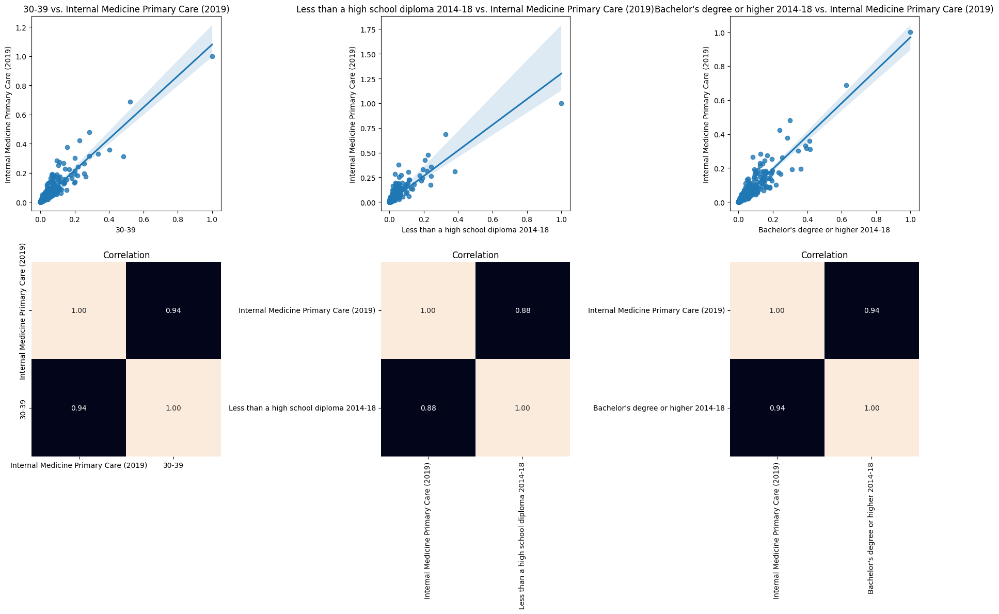

In [93]:
#utilizando un diagrama de puntos se visualizará la relación entre la variable predictora y las variables objetivo

fig, axis = plt.subplots(2, 3, figsize=(18, 12))
total_data = pd.concat([train_data, test_data])

# Scatter Plot 1
sns.regplot(data=total_data, x="30-39", y="Internal Medicine Primary Care (2019)", ax=axis[0, 0])
axis[0, 0].set_title("30-39 vs. Internal Medicine Primary Care (2019)")

# Scatter Plot 2
sns.regplot(data=total_data, x="Less than a high school diploma 2014-18", y="Internal Medicine Primary Care (2019)", ax=axis[0, 1])
axis[0, 1].set_title("Less than a high school diploma 2014-18 vs. Internal Medicine Primary Care (2019)")

# Scatter Plot 3
sns.regplot(data=total_data, x="Bachelor's degree or higher 2014-18", y="Internal Medicine Primary Care (2019)", ax=axis[0, 2])
axis[0, 2].set_title("Bachelor's degree or higher 2014-18 vs. Internal Medicine Primary Care (2019)")

# Heatmap 1
sns.heatmap(total_data[["Internal Medicine Primary Care (2019)", "30-39"]].corr(), annot=True, fmt=".2f", ax=axis[1, 0], cbar=False)
axis[1, 0].set_title("Correlation")

# Heatmap 2
sns.heatmap(total_data[["Internal Medicine Primary Care (2019)", "Less than a high school diploma 2014-18"]].corr(), annot=True, fmt=".2f", ax=axis[1, 1], cbar=False)
axis[1, 1].set_title("Correlation")

# Heatmap 3
sns.heatmap(total_data[["Internal Medicine Primary Care (2019)", "Bachelor's degree or higher 2014-18"]].corr(), annot=True, fmt=".2f", ax=axis[1, 2], cbar=False)
axis[1, 2].set_title("Correlation")

plt.subplots_adjust(hspace=0.5)  # Adjust the vertical space between subplots

plt.tight_layout()
plt.show()

In [94]:
X_train = train_data.drop(["Internal Medicine Primary Care (2019)"], axis = 1)
y_train = train_data["Internal Medicine Primary Care (2019)"]
X_test = test_data.drop(["Internal Medicine Primary Care (2019)"], axis = 1)
y_test = test_data["Internal Medicine Primary Care (2019)"]

In [95]:
# Paso 2: Inicialización y entrenamiento del modelo¶

from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [96]:
# Después del proceso de entrenamiento podemos conocer los parámetros que ha ajustado el modelo

print(f"Intercepto (a): {model.intercept_}")
print(f"Coeficientes (b1, b2): {model.coef_}")

Intercepto (a): 0.0014646113646095173
Coeficientes (b1, b2): [-0.21207903  0.41161155  0.84328575  0.06269456 -0.01013837]


In [97]:
# Paso 3: Predicción del modelo

y_pred = model.predict(X_test)
y_pred

array([0.00774332, 0.00418552, 0.0022859 , 0.02115237, 0.00293711,
       0.00414927, 0.0022782 , 0.00155065, 0.00206067, 0.00219367,
       0.00543122, 0.00195215, 0.02146771, 0.00312533, 0.00430565,
       0.00382978, 0.00835525, 0.00355462, 0.00242993, 0.00247352,
       0.00752886, 0.0016791 , 0.0039173 , 0.01235507, 0.00196525,
       0.00252412, 0.00613471, 0.0049227 , 0.00249573, 0.00325623,
       0.06728431, 0.00193788, 0.00160697, 0.01456558, 0.01196461,
       0.00185674, 0.03788875, 0.00309631, 0.00214032, 0.00161968,
       0.00418884, 0.01421366, 0.0207915 , 0.0024966 , 0.00392677,
       0.13735755, 0.00274661, 0.00231401, 0.01034136, 0.03103338,
       0.01550299, 0.01163866, 0.00172464, 0.00650139, 0.00594906,
       0.00467478, 0.00240159, 0.00198295, 0.00197326, 0.00169364,
       0.0389004 , 0.00566014, 0.00225485, 0.00301478, 0.02755175,
       0.00225241, 0.00448384, 0.00191723, 0.00197363, 0.06223658,
       0.00181282, 0.00347778, 0.00210427, 0.00300916, 0.00432

In [98]:
from sklearn.metrics import mean_squared_error, r2_score

print(f"Error cuadrático medio: {mean_squared_error(y_test, y_pred)}")
print(f"Coeficiente de determinación: {r2_score(y_test, y_pred)}")

Error cuadrático medio: 7.593056906413536e-05
Coeficiente de determinación: 0.8714313074878353


## Paso 4: Construye un modelo de Lasso

In [99]:
from sklearn.linear_model import Lasso
import numpy as np

# Carga de los datos de train y test
# Asegúrate de que X_train y X_test tengan el mismo número de columnas y estén normalizados previamente

# Crear un modelo Lasso con un valor de alpha (parámetro de regularización) y un máximo de iteraciones
alpha = 0.1
max_iter = 300
lasso_model = Lasso(alpha=alpha, max_iter=max_iter)

# Ajustar el modelo a los datos de entrenamiento
lasso_model.fit(X_train, y_train)

# Realizar predicciones en los datos de test
y_pred = lasso_model.predict(X_test)

# Si tienes valores reales y_test con los que comparar las predicciones, puedes calcular el error (opcional)
# error = mean_squared_error(y_test, y_pred)

# También puedes obtener los coeficientes aprendidos y el intercepto
coeficientes = lasso_model.coef_
intercepto = lasso_model.intercept_

print("Coeficientes:", coeficientes)
print("Intercepto:", intercepto)

Coeficientes: [0. 0. 0. 0. 0.]
Intercepto: 0.011518093597820165
